# Import packages & functions

In [1]:
# Enable autoreload to automatically update changes in modules $ pip install -U pynwb
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
import numpy as np
from pynwb import NWBHDF5IO
from pathlib import Path
import MySrc
from MySrc.general_utilities import load_nwb, get_units_tables, get_trial_timing, compute_average_firing_rate, fetch_key_metrices, check_quality, save_figure # Import the function
from MySrc.plot_utilities import plot_neuron_general_metrices

# Load example data session

In [6]:
# Set the path of the NWB file
filepath = r"H:\My Drive\NWB_data_Monkey\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-03-125141_prepro.nwb"# Open the file (dont forget to close it at the end "io.close()")
nwbfile, io = load_nwb(filepath)
units_tables, table_names = get_units_tables(nwbfile)
print(table_names)
trials_timings = get_trial_timing(nwbfile)
#trials_timings['start_times']

['units-B1-129-160', 'units-C1-257-288', 'units-D1-385']


# prototype code for visulazation figure 1

C:\Users\admin\AppData\Local\Temp\ipykernel_22072\1618008661.py:209: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


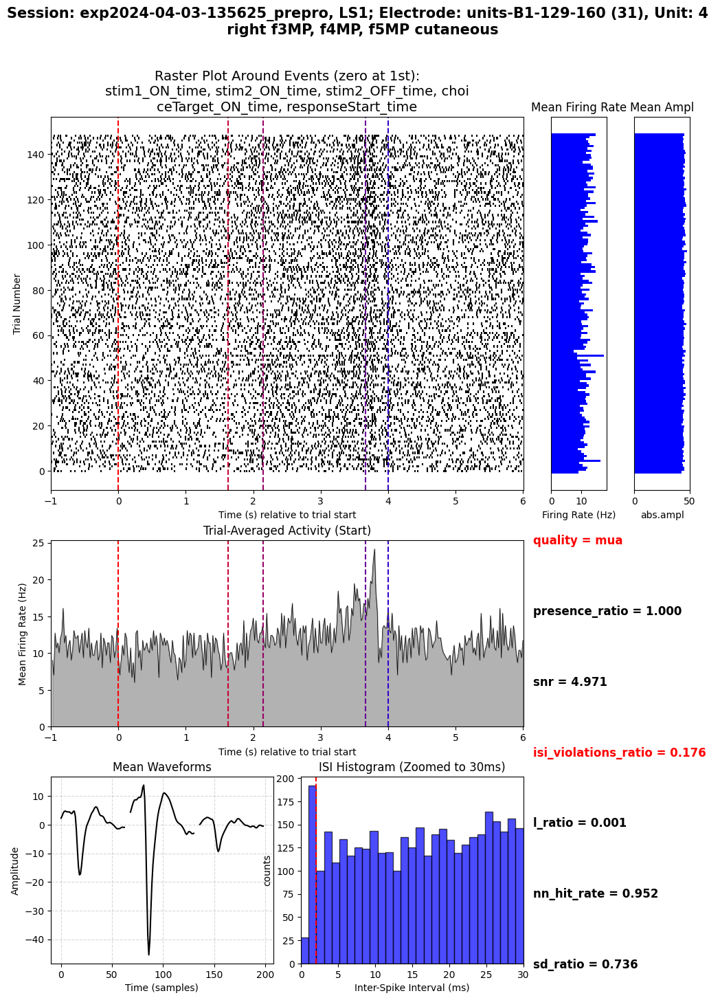

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.colors as mcolors


# ## Define trial window marks
# trial_window_marks = ["stim1_ON_time", "stim2_ON_time", "stim2_OFF_time", "choiceTarget_ON_time","responseStart_time"]
# trial_window_expanding=[-1, +2]

# # Filter valid trials where choiceTarget_ON_time > 0
# valid_trials_mask = trials_timings['choiceTarget_ON_time'] > 0

# # Set trial start time based on the first mark
# trial_center = trials_timings[trial_window_marks[0]][valid_trials_mask]

# # Compute mean intervals between successive marks
# mark_intervals = []
# for i in range(len(trial_window_marks) - 1):
#     mark1, mark2 = trial_window_marks[i], trial_window_marks[i + 1]
#     interval = trials_timings[mark2][valid_trials_mask] - trials_timings[mark1][valid_trials_mask]
#     mean_interval = np.mean(interval)  # Compute mean interval between mark1 → mark2
#     mark_intervals.append(mean_interval)

# # Compute trial stop time by adding all mean intervals sequentially
# window_start = trial_window_expanding[0]
# window_stop = np.sum(mark_intervals) + trial_window_expanding[1]
# trial_window = [window_start, window_stop]


# # Compute trial-averaged firing rates vs in window time using your function
# smoothed_firing_rate_start, time_bins_start = compute_average_firing_rate(unit_spike_times, trial_center, window=trial_window,smooth = False,bin_size = 0.02)

# num_lines = len(mark_intervals) + 1  # +1 for the first line at 0
# cm = mcolors.LinearSegmentedColormap.from_list(
#     "red_purple_blue", ["red", "purple", "blue"]
# )


# # Compute Inter-Spike Intervals (ISI) and remove zero/negative values
# ISIs = np.diff(unit_spike_times) * 1000  # Convert to ms
# ISIs = ISIs[ISIs > 0]  # ✅ Remove zero or negative values

# # Sample waveform data (Replace with actual data)
# x_offset = waveform_mean.shape[1] + 5  # Offset for horizontal separation

# ## Compute trial-wise mean firing rate (for third row)
# trial_firing_rates = []
# trial_mean_amp = []
# trial_duration = trial_window[1] - trial_window[0]
# for trial_idx in range(len(trial_center)):
#     # Count total num of spiking and calculate FR in trial window surround each trial center
#     trial_spikes = unit_spike_times[(unit_spike_times >= trial_center[trial_idx]+trial_window[0]) & 
#                                     (unit_spike_times <= trial_center[trial_idx]+trial_window[1])]
    
#     trial_firing_rates.append(len(trial_spikes) / trial_duration if trial_duration > 0 else 0)

#     # fetch all spiking amps and calculate mea amp of that trial
#     trial_spikes_amps = abs(unit_spike_amp[(unit_spike_times >= trial_center[trial_idx]+trial_window[0]) & 
#                                     (unit_spike_times <= trial_center[trial_idx]+trial_window[1])])
#     trial_mean_amp.append(np.mean(trial_spikes_amps))


# # Create 4x3 figure (Rows 1 & 2 with `sharey='row'`)
# fig, axes = plt.subplots(
#     ncols=4, 
#     nrows=3,  # ✅ Only create first 2 rows here
#     figsize=(12, 16), 
#     gridspec_kw={'width_ratios': [4, 4, 1,1], 'height_ratios': [2, 1, 1]},  # ✅ No row 3 yet!
#     sharey='row'
# )  

# ## **Row 1: Raster Plots & Mean Firing Rate**
# # Raster plot centered around trial start
# gs = axes[0, 0].get_gridspec()  # Get grid layout
# for ax in [axes[0, 0], axes[0, 1]]:  # Remove the individual subplots
#     ax.remove()

# # Create a new subplot that spans both columns
# ax_raster = fig.add_subplot(gs[0, 0:2])  

# # Convert list to string
# event_names_str = ", ".join(trial_window_marks)

# # Break into multiple lines every 50 characters
# max_line_length = 50  # Max characters per line
# wrapped_lines = [event_names_str[i:i+max_line_length] for i in range(0, len(event_names_str), max_line_length)]
# # Join lines with newline characters
# formatted_title = "Raster Plot Around Events (zero at 1st):\n" + "\n".join(wrapped_lines)
# # Set title with automatic line wrapping
# ax_raster.set_title(formatted_title, fontsize=14)  # Adjust fontsize as needed


# for trial_idx, start_time in enumerate(trial_center):
#     aligned_spikes = unit_spike_times - start_time
#     filtered_spikes = aligned_spikes[(aligned_spikes >= trial_window[0]) & (aligned_spikes <= trial_window[1])]
#     ax_raster.eventplot(filtered_spikes, lineoffsets=trial_idx, colors='black')

# # Draw first vertical line at 0 with the first color
# line = 0
# ax_raster.axvline(line, color=cm(0), linestyle='--')  
# # Loop through mark intervals and draw vertical lines with different colors
# for i, line_step in enumerate(mark_intervals):
#     line += line_step
#     ax_raster.axvline(line, color=cm((i + 1) / num_lines), linestyle='--')  # Dynamically select color

# ax_raster.set_xlim(trial_window)
# ax_raster.set_xlabel("Time (s) relative to trial start")
# ax_raster.set_ylabel("Trial Number")


# # Mean firing rate per trial (Row 1, Rightmost Panel)
# axes[0, 2].barh(range(len(trial_firing_rates)), trial_firing_rates, color='blue', height=1)
# axes[0, 2].set_title("Mean Firing Rate")
# axes[0, 2].set_xlabel("Firing Rate (Hz)")
# axes[0, 2].set_yticks([])

# # Mean firing rate per trial (Row 1, Rightmost Panel)
# axes[0, 3].barh(range(len(trial_mean_amp)), trial_mean_amp, color='blue', height=1)
# axes[0, 3].set_title("Mean Ampl")
# axes[0, 3].set_xlabel("abs.ampl")
# axes[0, 3].set_yticks([])

# ## **Row 2: Trial-Averaged Smoothed Activity (Now as Area Plot)**
# # Trial-averaged activity centered on trial start
# # Raster plot centered around trial start
# gs = axes[1, 0].get_gridspec()  # Get grid layout
# for ax in [axes[1, 0], axes[1, 1]]:  # Remove the individual subplots
#     ax.remove()
# # Create a new subplot that spans both columns
# ax_TrialMean = fig.add_subplot(gs[1, 0:2])  

# ax_TrialMean.fill_between(time_bins_start[1:], smoothed_firing_rate_start, color='black', alpha=0.3)
# ax_TrialMean.plot(time_bins_start[1:], smoothed_firing_rate_start, color='black',linewidth = 0.5)
# # Draw first vertical line at 0 with the first color
# line = 0
# ax_TrialMean.axvline(line, color=cm(0), linestyle='--')  
# # Loop through mark intervals and draw vertical lines with different colors
# for i, line_step in enumerate(mark_intervals):
#     line += line_step
#     ax_TrialMean.axvline(line, color=cm((i + 1) / num_lines), linestyle='--')  # Dynamically select color
# ax_TrialMean.set_xlim(trial_window)
# ax_TrialMean.set_ylim([0,None])
# ax_TrialMean.set_xlabel("Time (s) relative to trial start")
# ax_TrialMean.set_ylabel("Mean Firing Rate (Hz)")
# ax_TrialMean.set_title("Trial-Averaged Activity (Start)")


# # Remove rightmost column in row 2 (not needed)
# axes[1, 2].axis("off")
# axes[1, 3].axis("off")
# axes[2, 0].axis("off")
# axes[2, 1].axis("off")
# axes[2, 2].axis("off")
# axes[2, 3].axis("off")

# ### **Manually Create Row 3 (Independent Y-Axes)**
# # **Waveform Plot (1st column)**
# ax_waveform = fig.add_subplot(3, 4, 9)  # ✅ Insert new subplot manually
# ax_waveform.set_title("Mean Waveforms")
# for ch in range(waveform_mean.shape[0]):
#     x_values = np.arange(waveform_mean.shape[1]) + ch * x_offset  # Shift each waveform
#     ax_waveform.plot(x_values, waveform_mean[ch, :], label=f'Ch {ch+1}', color='black')

# ax_waveform.set_xlabel("Time (samples)")
# ax_waveform.set_ylabel("Amplitude")
# ax_waveform.grid(True, linestyle="--", alpha=0.5)

# # **ISI Histogram (2nd column)**
# ax_isi = fig.add_subplot(3, 4, 10)  # ✅ Insert new subplot manually
# ax_isi.set_title("ISI Histogram (Zoomed to 30ms)")
# ax_isi.hist(ISIs, bins=np.linspace(0, 30, 30), color='blue', alpha=0.7, edgecolor='black', log=False)
# ax_isi.axvline(2, color='red', linestyle="--", label="2ms Refractory Period")
# ax_isi.set_xlabel("Inter-Spike Interval (ms)")
# ax_isi.set_ylabel("counts")
# ax_isi.set_xlim([0,30])


# # **Empty panel for future use**
# ax_empty = fig.add_subplot(3, 3, 9)
# ax_empty.axis("off")

# # Extract neuron metrics
# fetched_metrices, metrices_names = fetch_key_metrices(units_tables, table_names, electrode_id, unit_id)

# # Define text position (adjust as needed)
# text_x = 0.71  # Adjust X position to fit inside the empty space
# text_y = 0.5  # Start from top of empty space
# line_spacing = (text_y-0.05) / len(metrices_names) if len(metrices_names) > 0 else 0.05  # Ensure proper spacing

# # Add each metric as a text annotation
# for i, met_name in enumerate(metrices_names):
#     metric_value = fetched_metrices[met_name]
#     text_line = f"{met_name} = {metric_value:.3f}" if isinstance(metric_value, (int, float)) else f"{met_name} = {metric_value}"
#     # Check quality of the metric
#     is_good_quality = check_quality(met_name, metric_value)
    
#     # Choose color based on quality check
#     text_color = "red" if not is_good_quality else "black"
    
#     # Display text with color coding
#     fig.text(text_x, text_y - i * line_spacing, text_line, fontsize=12, fontweight="bold", color=text_color, verticalalignment="top")

# # Add the grand title to the entire figure
# i = unit_id
# fig.suptitle(
#     f'Session: {Path(filepath).stem}, {location.iloc[i]}; Electrode: {table_names[electrode_id]} ({rel_id.iloc[i]}), Unit: {true_unit_ids[i]} \n {BodySide_1.iloc[i]} {BodyPart_1.iloc[i]} {Modality_1.iloc[i]}',
#       fontsize=15, fontweight="bold")
# # Adjust layout for better spacing
# plt.tight_layout()
# # Show the plot
# plt.show()


In [86]:
fetched_metrices['quality'] == "mua"

True

# Example of plot unit visualization figure 1

In [8]:
unit_id = 6
electrode_id = 0
unit_spike_times = units_tables[table_names[electrode_id]]["spike_times"][unit_id]
waveform_mean = units_tables[table_names[electrode_id]]["waveform_mean"][unit_id]
unit_spike_amp = units_tables[table_names[electrode_id]]["spike_amplitudes"][unit_id]
start_times = trials_timings['start_time']
stop_times = trials_timings['stop_time']

fig_filename is in format of f"{Path(filepath).stem}_{location.iloc[i]}_Electrode-{table_names[electrode_id]}-{rel_id.iloc[i]}_Unit-{true_unit_ids[i]}"

plot_neuron_general_metrices allows multiple input please check comment in plot_utilities
fetch_key_metrices, check_quality, and compute_average_firing_rate respectively control what metrices to be extracted in test,
what is the threshold to mark a metrice red, and how to gaussian smooth trial-averaging firing rate

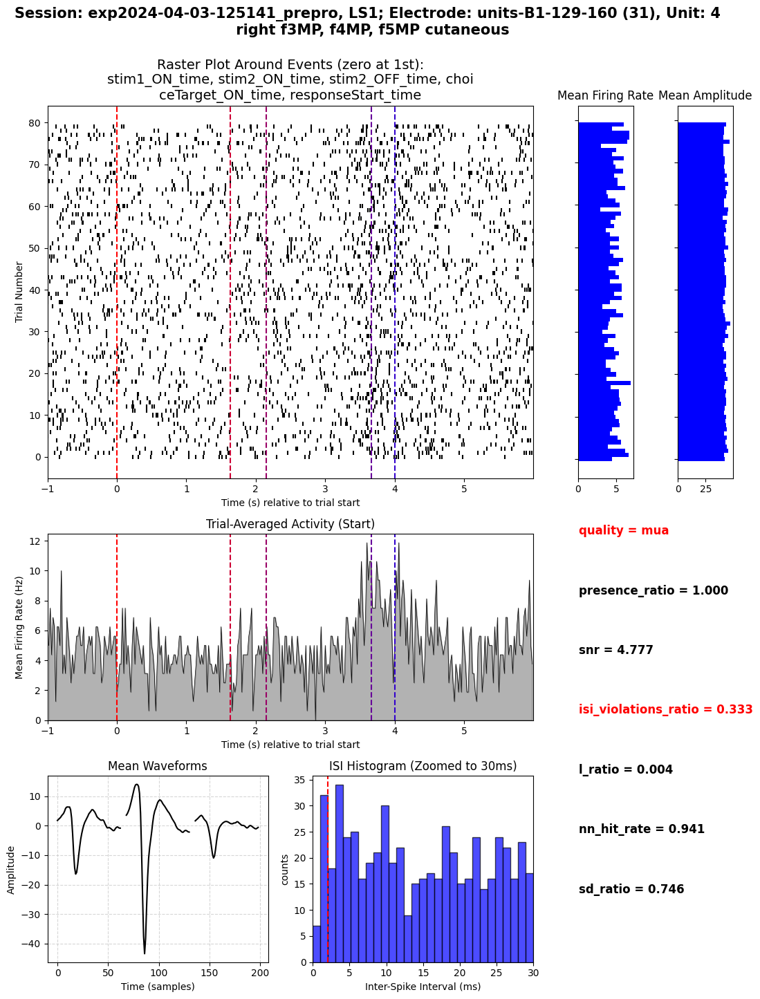

In [9]:
fig,fig_filename = plot_neuron_general_metrices(
    filepath, electrode_id=0, unit_id=1, resize = 0.9,smooth=False)
#save_figure(fig, ".jpg")  # Will save as "231203153045.jpg" (date+time)

In [ ]:
save_figure(fig, ".jpg",name = fig_filename)  # Will save as "231203153045.jpg" (date+time)

✅ Figure saved at: d:\Documents\GitHub\NWB_visualization\notebooks\example_plots\exp2024-04-03-135625_prepro_LS1_Electrode-units-B1-129-160-31_Unit-4_250306153048.jpg


# Example of plot all units visualization 1'

In [19]:
# Enable autoreload to automatically update changes in modules
%load_ext autoreload
%autoreload 2
from MySrc.plot_utilities import plot_general_metrices_all_units
import os

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [33]:
# Fetch unit data from tables
filepath = "Y:\Data_Albus\Albus_NeuralData\Albus-S1_preproNWB\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro.nwb"# Open the file (dont forget to close it at the end "io.close()")

the silenting plot displaying function does not work for jupyter notebook for unknow reason, so a lot of figure gonna be ommited at the end of processing

Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_LS1_Electrode-units-B1-129-160-19_Unit-26_250306184010.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_LS1_Electrode-units-B1-129-160-17_Unit-32_250306184013.jpg


d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_LS1_Electrode-units-B1-129-160-16_Unit-37_250306184017.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_LS1_Electrode-units-B1-129-160-16_Unit-40_250306184020.jpg


d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_LS1_Electrode-units-B1-129-160-11_Unit-49_250306184024.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_LS1_Electrode-units-B1-129-160-12_Unit-51_250306184027.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_LS1_Electrode-units-B1-129-160-11_Unit-53_250306184031.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_LS1_Electrode-units-B1-129-160-10_Unit-57_250306184035.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_LS1_Electrode-units-B1-129-160-8_Unit-59_250306184043.jpg
✅

d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-31_Unit-2_250306184056.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-30_Unit-7_250306184059.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-30_Unit-8_250306184103.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-26_Unit-18_250306184106.jpg


d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-25_Unit-19_250306184109.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-25_Unit-20_250306184112.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-25_Unit-21_250306184115.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-24_Unit-27_250306184119.jpg


d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
D:\Documents\GitHub\NWB_visualization\MySrc\plot_utilities.py:89: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-22_Unit-28_250306184122.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-19_Unit-39_250306184125.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-17_Unit-45_250306184129.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-18_Unit-47_250306184132.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-16_Unit-49_250306184135.jpg


d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-11_Unit-60_250306184142.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-12_Unit-63_250306184145.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-6_Unit-90_250306184148.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-4_Unit-91_250306184151.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-3_Unit-92_250306184155.jpg
✅ F

d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-8_Unit-94_250306184202.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-8_Unit-95_250306184205.jpg


d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-13_Unit-96_250306184208.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-6_Unit-97_250306184211.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-9_Unit-98_250306184215.jpg


d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-20_Unit-99_250306184218.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-10_Unit-100_250306184221.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-5_Unit-101_250306184225.jpg


d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-18_Unit-102_250306184229.jpg


d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-C2-289-320-18_Unit-46_250306184232.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-29_Unit-9_250306184235.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-27_Unit-12_250306184238.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-28_Unit-15_250306184242.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-23_Unit-25_250306184245.jpg
✅

d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-19_Unit-32_250306184251.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-13_Unit-50_250306184256.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-12_Unit-57_250306184259.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-6_Unit-79_250306184303.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-5_Unit-80_250306184306.jpg


d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-3_Unit-83_250306184309.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-4_Unit-87_250306184313.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-4_Unit-89_250306184316.jpg


d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
d:\Documents\GitHub\NWB_visualization\venv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-30_Unit-90_250306184319.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-30_Unit-10_250306184323.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-26_Unit-91_250306184326.jpg
✅ Figure saved at: Z:\Kunpeng\Session_quality\Albus-S1_RightHand_psycho_NOpostchoice\exp2024-04-10-123415_prepro\exp2024-04-10-123415_prepro_RS1_Electrode-units-D1-385-416-26_Unit-19_250306184329.jpg


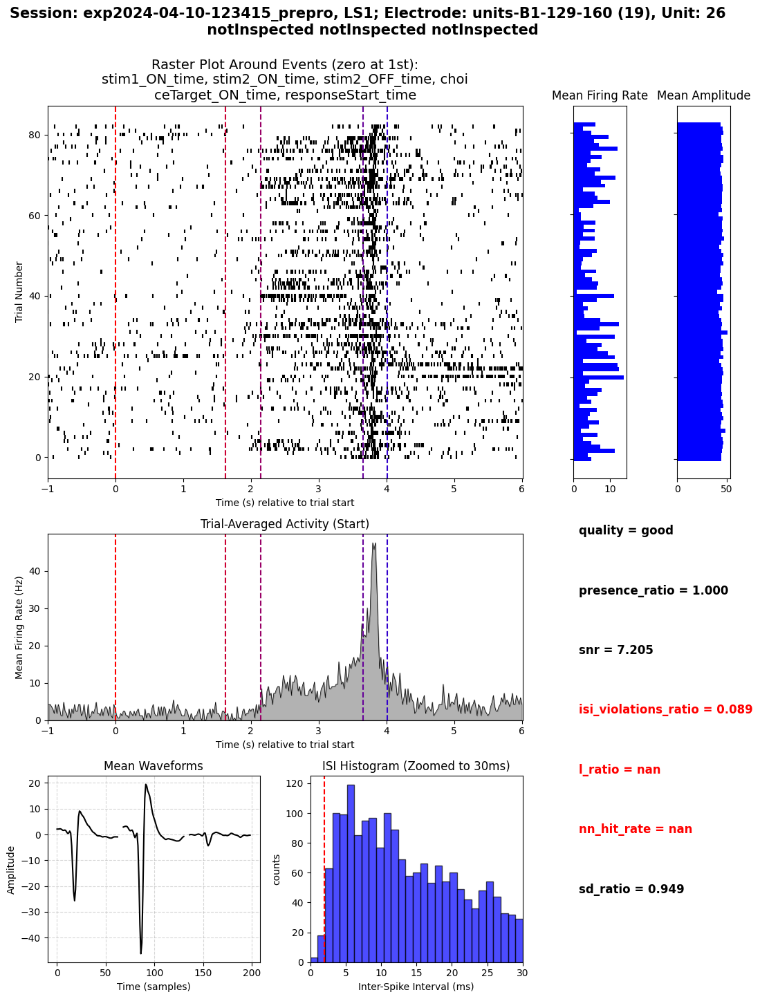

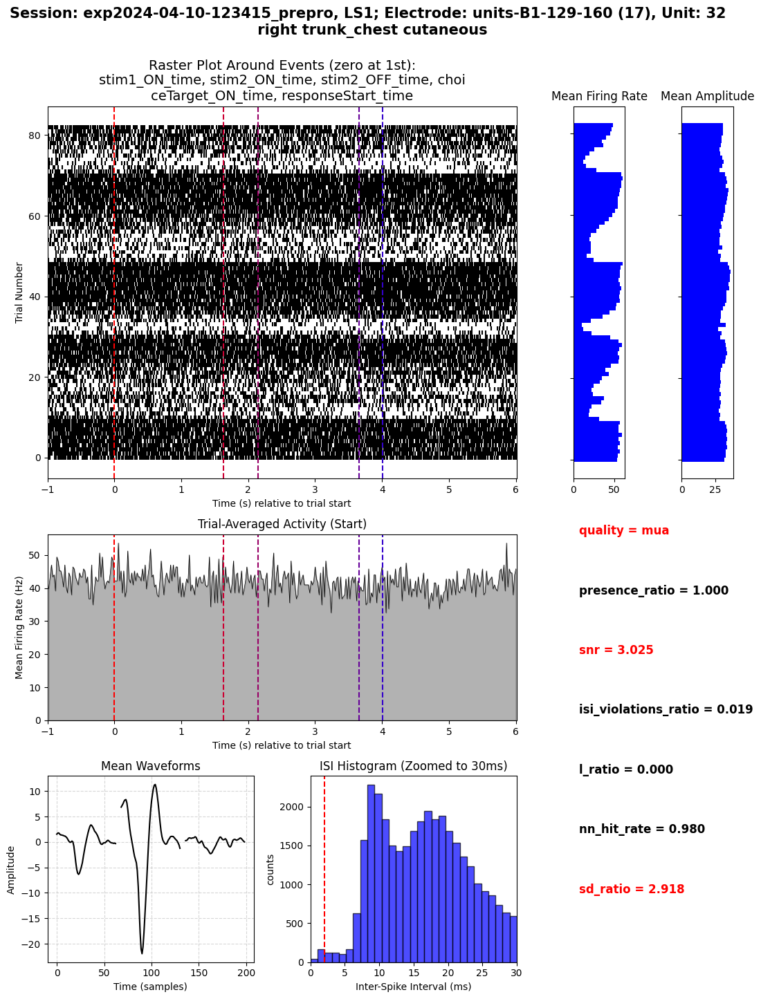

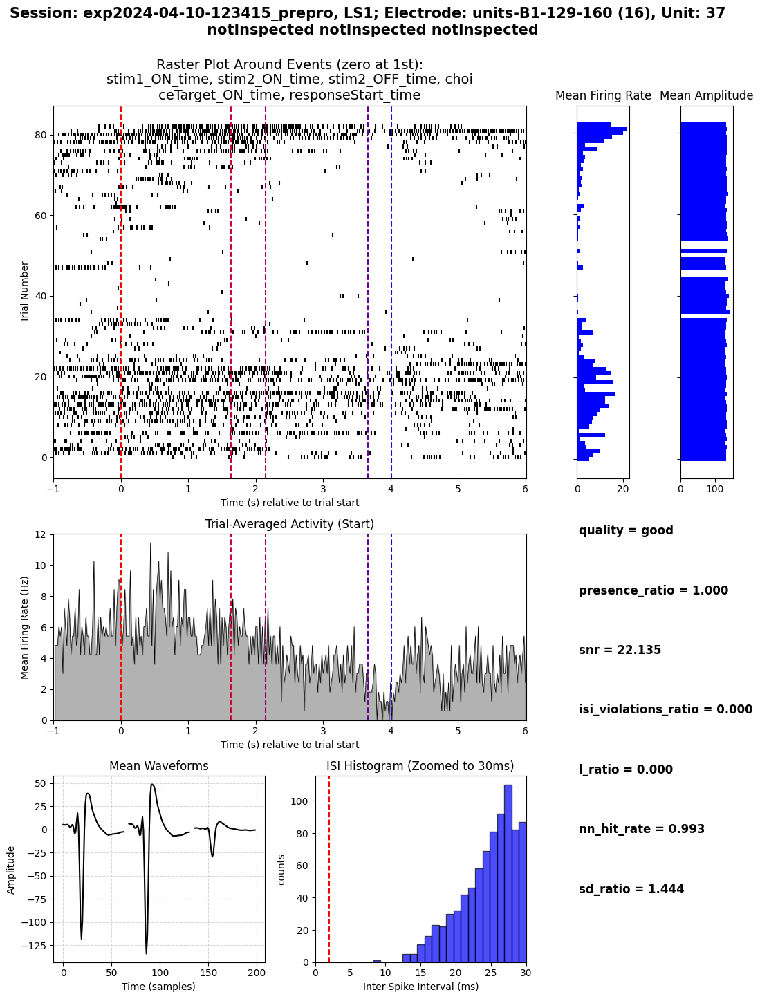

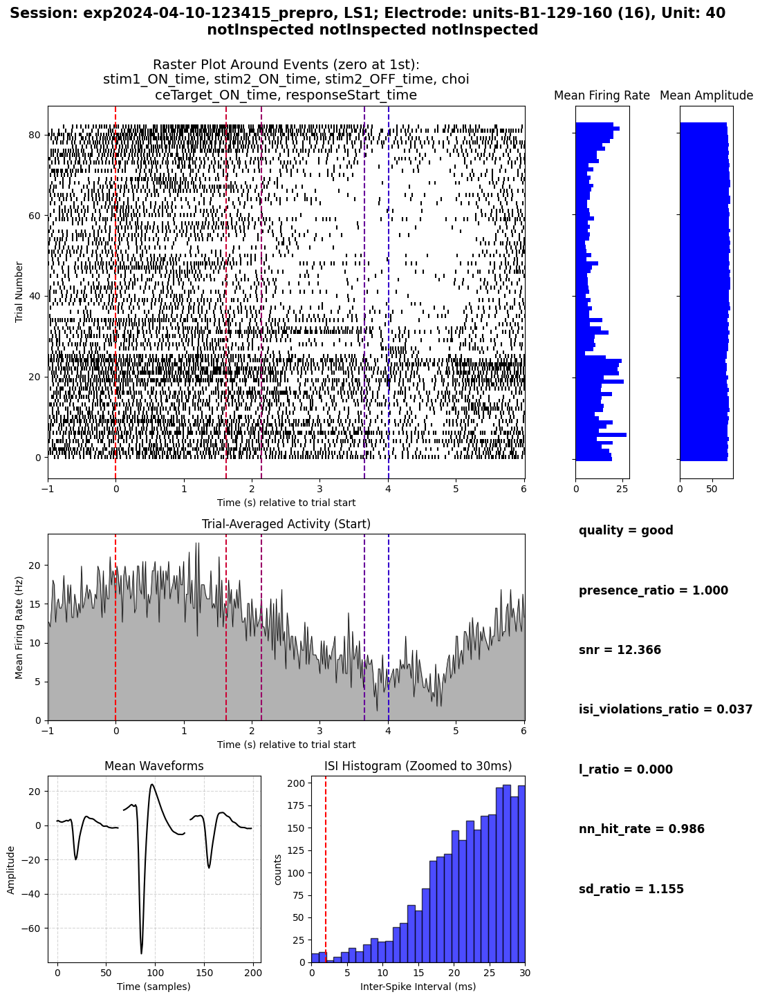

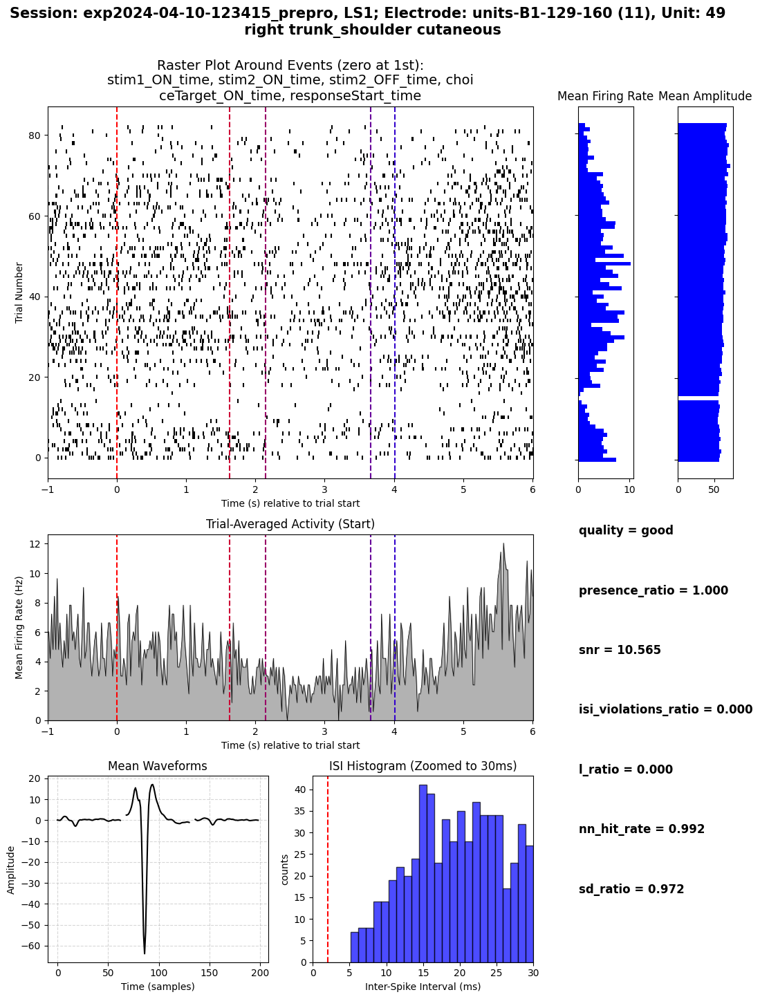

...

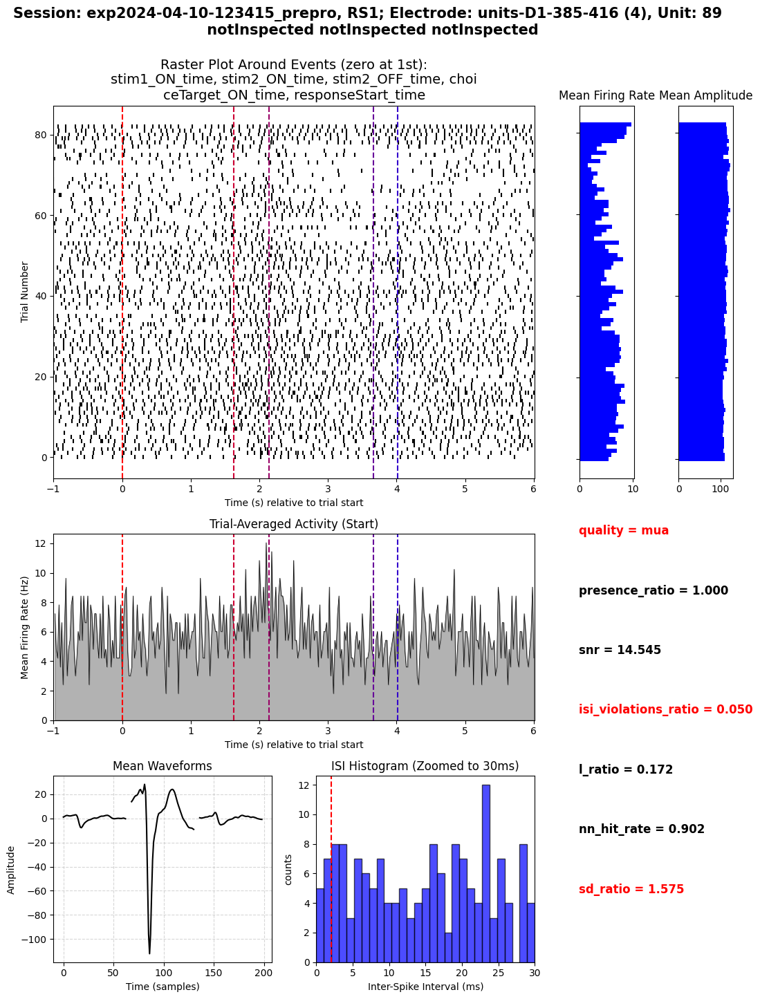

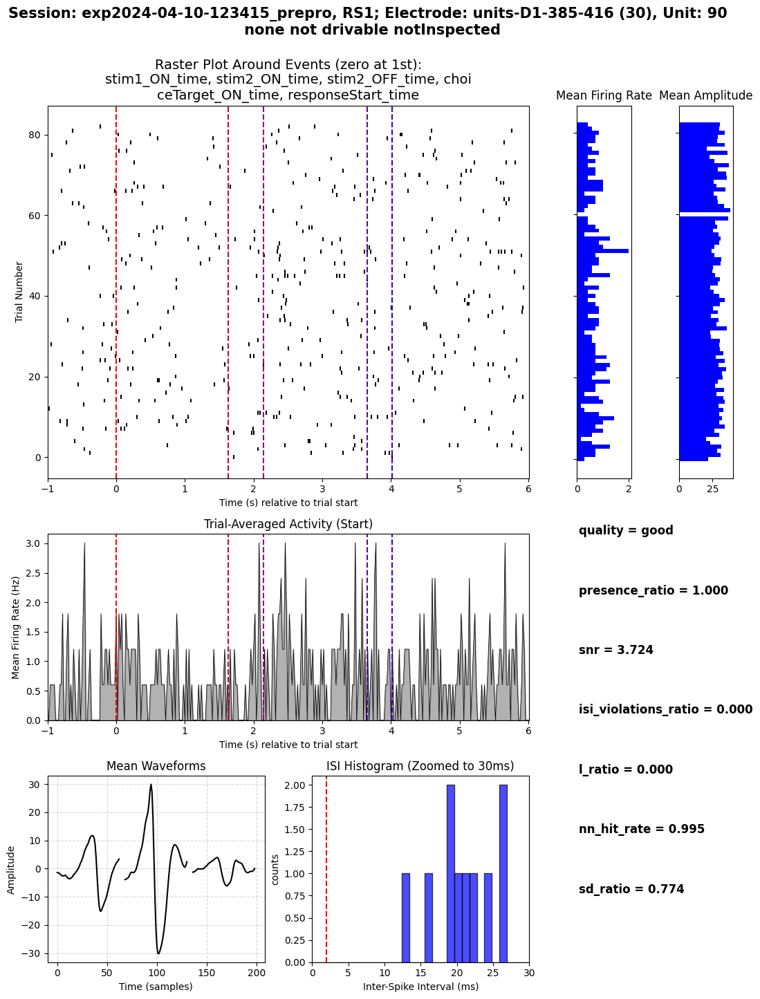

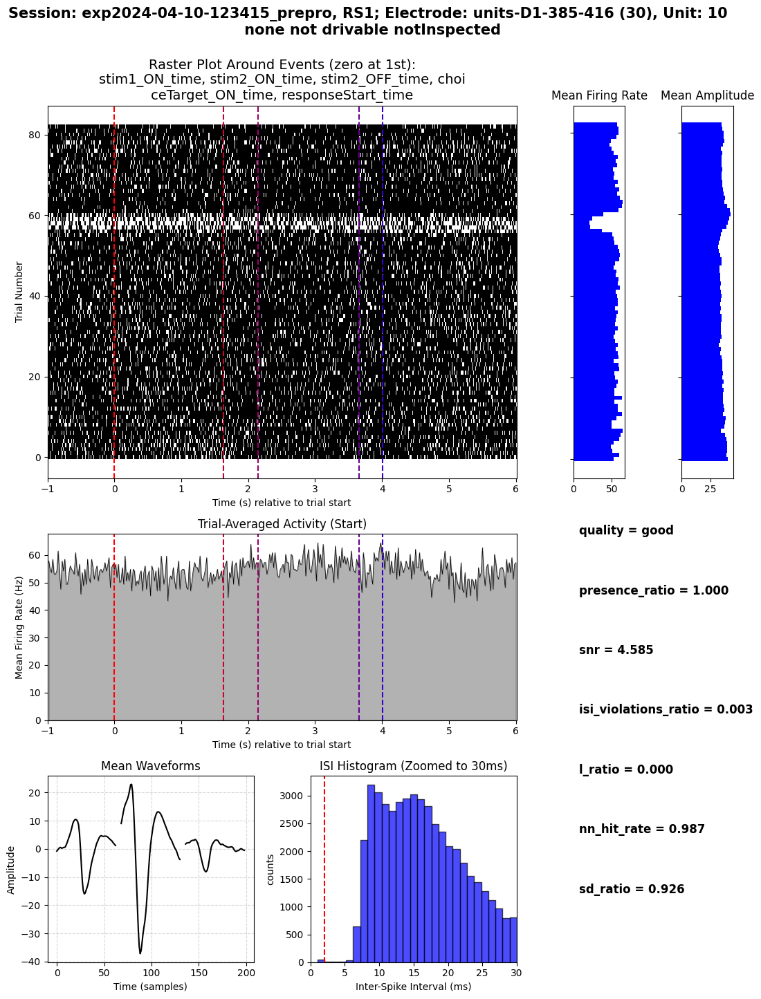

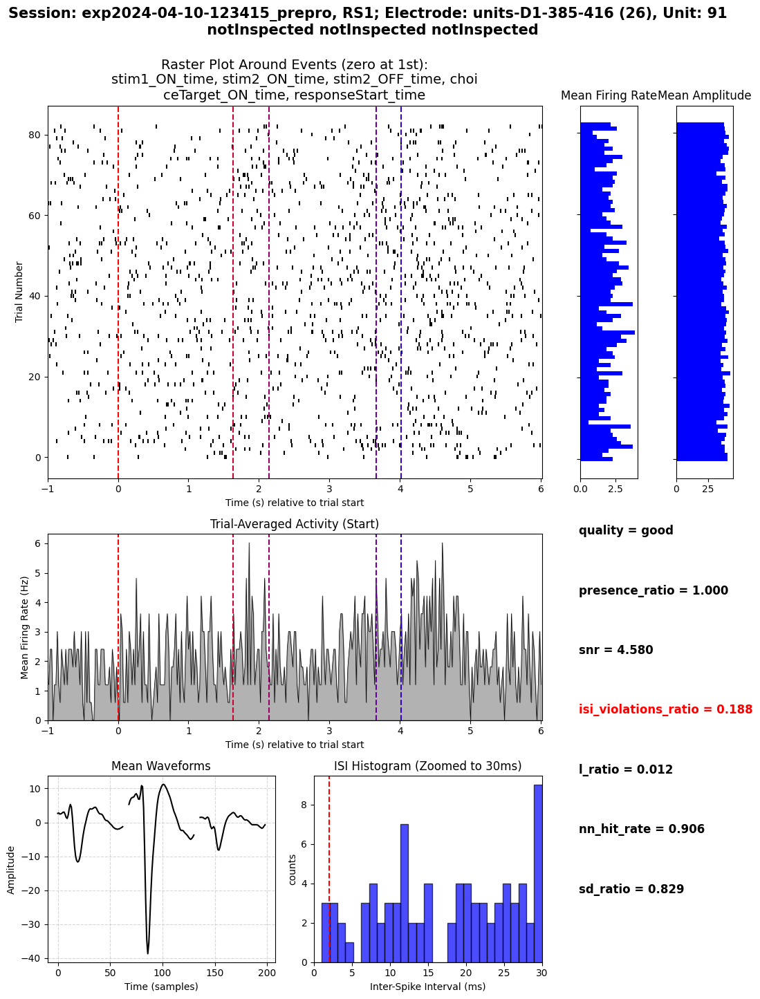

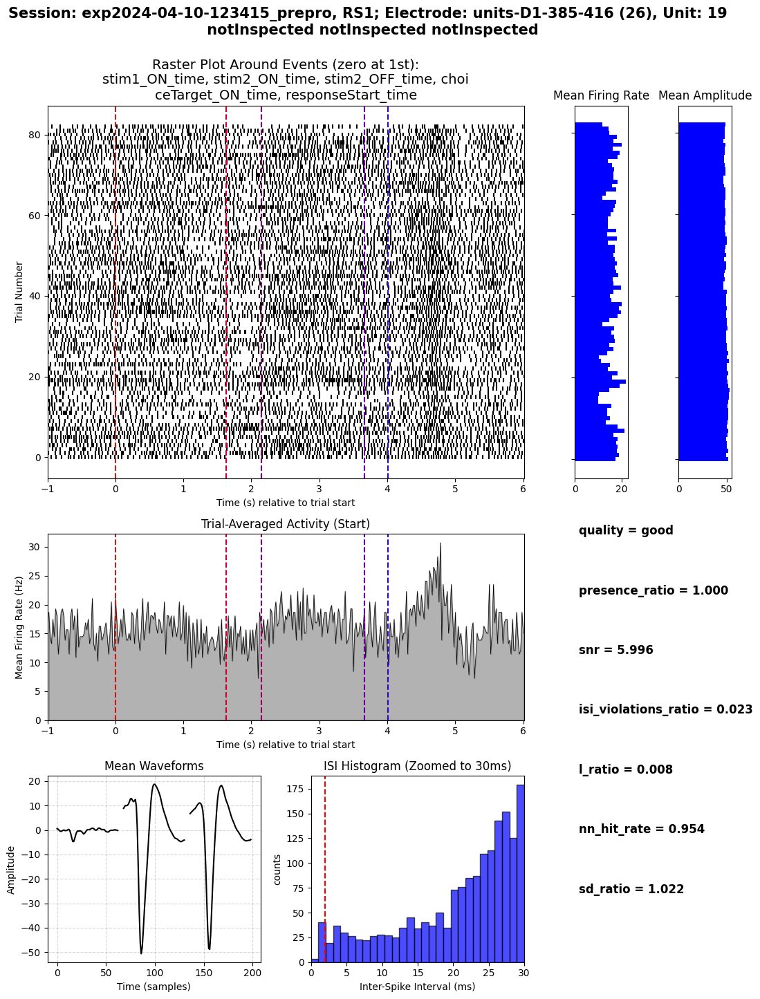

In [34]:
# Define base output folder
base_output_folder = r"Z:\Kunpeng\Session_quality"

# Extract the subpath after "Albus-S1_preproNWB"
relative_path = os.path.relpath(filepath, r"Y:\Data_Albus\Albus_NeuralData\Albus-S1_preproNWB")

# Remove the ".nwb" extension from the filename
relative_path_without_extension = os.path.splitext(relative_path)[0]  # Removes ".nwb"

# Combine with output folder
output_folder = os.path.join(base_output_folder, relative_path_without_extension)

print(output_folder)
plot_general_metrices_all_units(filepath, output_folder=output_folder, silent_plot= True)